From https://stacspec.org/en/tutorials/access-sentinel-2-data-aws/?utm_source=chatgpt.com

In [1]:
import dask.distributed
import folium
import folium.plugins
import geopandas as gpd
import odc.ui
import shapely.geometry
import yaml
from branca.element import Figure
from IPython.display import HTML, display
from odc.algo import to_rgba
from pystac_client import Client

from odc.stac import configure_rio, stac_load

In [2]:
def convert_bounds(bbox, invert_y=False):
    """
    Helper method for changing bounding box representation to leaflet notation

    ``(lon1, lat1, lon2, lat2) -> ((lat1, lon1), (lat2, lon2))``
    """
    x1, y1, x2, y2 = bbox
    if invert_y:
        y1, y2 = y2, y1
    return ((y1, x1), (y2, x2))

In [3]:
cfg = """---
sentinel-s2-l2a-cogs:
  assets:
    '*':
      data_type: uint16
      nodata: 0
      unit: '1'
    SCL:
      data_type: uint8
      nodata: 0
      unit: '1'
    visual:
      data_type: uint8
      nodata: 0
      unit: '1'
  aliases:  # Alias -> Canonical Name
    red: B04
    green: B03
    blue: B02
"*":
  warnings: ignore # Disable warnings about duplicate common names
"""
cfg = yaml.load(cfg, Loader=yaml.SafeLoader)

In [4]:
client = dask.distributed.Client()
configure_rio(cloud_defaults=True, aws={"aws_unsigned": True}, client=client)
display(client)

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 7.70 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38485,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:33721,Total threads: 2
Dashboard: http://127.0.0.1:41427/status,Memory: 1.92 GiB
Nanny: tcp://127.0.0.1:42503,


In [5]:
km2deg = 1.0 / 111
x, y = (-75.5, 40)  # Center point of a query
r = 100 * km2deg
bbox = (x - r, y - r, x + r, y + r)

catalog = Client.open("https://earth-search.aws.element84.com/v1")

query = catalog.search(
    collections=["sentinel-2-l2a"], datetime="2025-10-01", limit=100, bbox=bbox
)

items = list(query.items())
print(f"Found: {len(items):d} datasets")

# Convert STAC items into a GeoJSON FeatureCollection
stac_json = query.item_collection_as_dict()

Found: 9 datasets


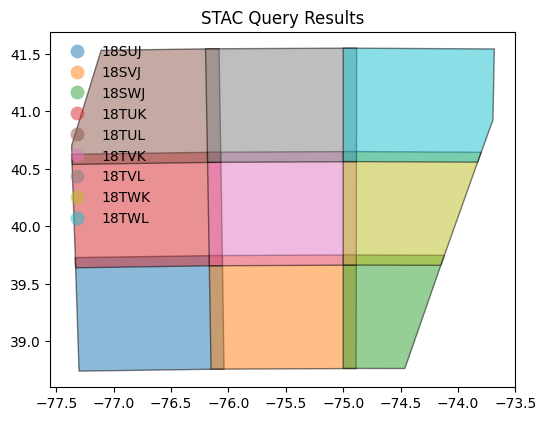

In [6]:
gdf = gpd.GeoDataFrame.from_features(stac_json, "epsg:4326")

# Compute granule id from components
gdf["granule"] = (
    gdf["mgrs:utm_zone"].apply(lambda x: f"{x:02d}")
    + gdf["mgrs:latitude_band"]
    + gdf["mgrs:grid_square"]
)

fig = gdf.plot(
    "granule",
    edgecolor="black",
    categorical=True,
    aspect="equal",
    alpha=0.5,
    figsize=(6, 12),
    legend=True,
    legend_kwds={"loc": "upper left", "frameon": False, "ncol": 1},
)
_ = fig.set_title("STAC Query Results")

In [7]:
# https://github.com/python-visualization/folium/issues/1501
fig = Figure(width="400px", height="500px")
map1 = folium.Map()
fig.add_child(map1)

folium.GeoJson(
    shapely.geometry.box(*bbox),
    style_function=lambda x: dict(fill=False, weight=1, opacity=0.7, color="olive"),
    name="Query",
).add_to(map1)

gdf.explore(
    "granule",
    categorical=True,
    tooltip=[
        "granule",
        "datetime",
        "s2:nodata_pixel_percentage",
        "eo:cloud_cover",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="STAC",
    m=map1,
)

map1.fit_bounds(bounds=convert_bounds(gdf.unary_union.bounds))
display(fig)

/tmp/ipykernel_46/1135620604.py:27: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  map1.fit_bounds(bounds=convert_bounds(gdf.unary_union.bounds))


In [8]:
# Since we will plot it on a map we need to use `EPSG:3857` projection
crs = "epsg:3857"
zoom = 2**5  # overview level 5

xx = stac_load(
    items,
    bands=("red", "green", "blue"),
    crs=crs,
    resolution=10 * zoom,
    chunks={},  # <-- use Dask
    groupby="solar_day",
    stac_cfg=cfg,
)
display(xx)

<xarray.Dataset> Size: 10MB
Dimensions:      (y: 1281, x: 1293, time: 1)
Coordinates:
  * y            (y) float64 10kB 5.094e+06 5.094e+06 ... 4.685e+06 4.684e+06
  * x            (x) float64 10kB -8.616e+06 -8.616e+06 ... -8.202e+06
  * time         (time) datetime64[ns] 8B 2025-10-01T16:02:02.755000
    spatial_ref  int32 4B 3857
Data variables:
    red          (time, y, x) uint16 3MB dask.array<chunksize=(1, 1281, 1293), meta=np.ndarray>
    green        (time, y, x) uint16 3MB dask.array<chunksize=(1, 1281, 1293), meta=np.ndarray>
    blue         (time, y, x) uint16 3MB dask.array<chunksize=(1, 1281, 1293), meta=np.ndarray>

In [9]:
%%time
rgba = to_rgba(xx, clamp=(1, 3000))
_rgba = rgba.compute()

CPU times: user 2.25 s, sys: 432 ms, total: 2.68 s
Wall time: 23.1 s


/tmp/ipykernel_46/870828199.py:26: DeprecationWarning: Geobox extraction logic has moved to odc-geo and the .geobox property is now deprecated.Please access via .odc.geobox instead.
  image_bounds = convert_bounds(_rgba.geobox.geographic_extent.boundingbox, invert_y=True)



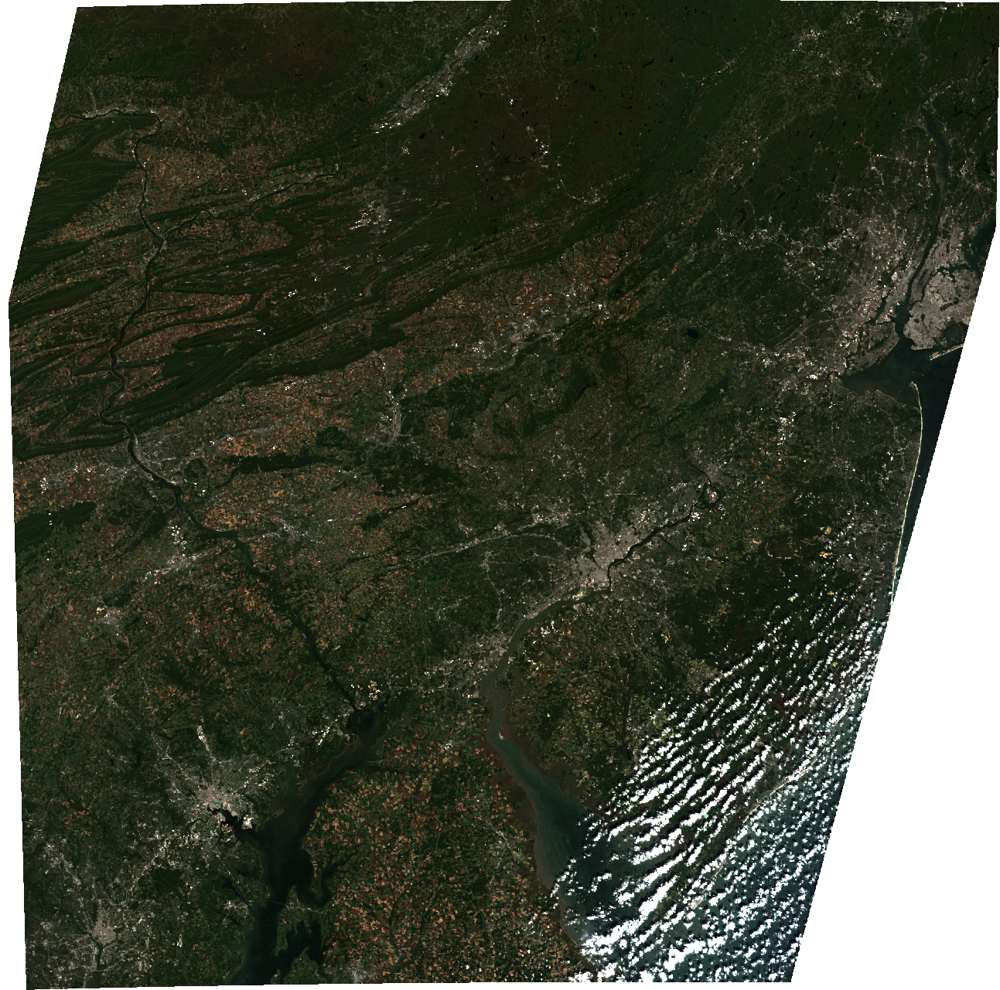

In [10]:
map2 = folium.Map()

folium.GeoJson(
    shapely.geometry.box(*bbox),
    style_function=lambda x: dict(fill=False, weight=1, opacity=0.7, color="olive"),
    name="Query",
).add_to(map2)

gdf.explore(
    "granule",
    categorical=True,
    tooltip=[
        "granule",
        "datetime",
        "s2:nodata_pixel_percentage",
        "eo:cloud_cover",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="STAC",
    m=map2,
)


# Image bounds are specified in Lat/Lon order with Lat axis inversed
image_bounds = convert_bounds(_rgba.geobox.geographic_extent.boundingbox, invert_y=True)
img_ovr = folium.raster_layers.ImageOverlay(
    _rgba.isel(time=0).data, bounds=image_bounds, name="Image"
)
img_ovr.add_to(map2)
map2.fit_bounds(bounds=image_bounds)

folium.LayerControl().add_to(map2)
folium.plugins.Fullscreen().add_to(map2)
map2

In [11]:
r = 6.5 * km2deg
small_bbox = (x - r, y - r, x + r, y + r)

yy = stac_load(
    items,
    bands=("red", "green", "blue"),
    crs=crs,
    resolution=10,
    chunks={},  # <-- use Dask
    groupby="solar_day",
    stac_cfg=cfg,
    bbox=small_bbox,
)
im_small = to_rgba(yy, clamp=(1, 3000)).compute()

In [12]:
img_zoomed_in = odc.ui.mk_data_uri(
    odc.ui.to_jpeg_data(im_small.isel(time=0).data, quality=80), "image/jpeg"
)
print(f"Image url: {img_zoomed_in[:64]}...")

Image url: data:image/jpeg;base64,/9j/2wBDAAYEBQYFBAYGBQYHBwYIChAKCgkJChQOD...



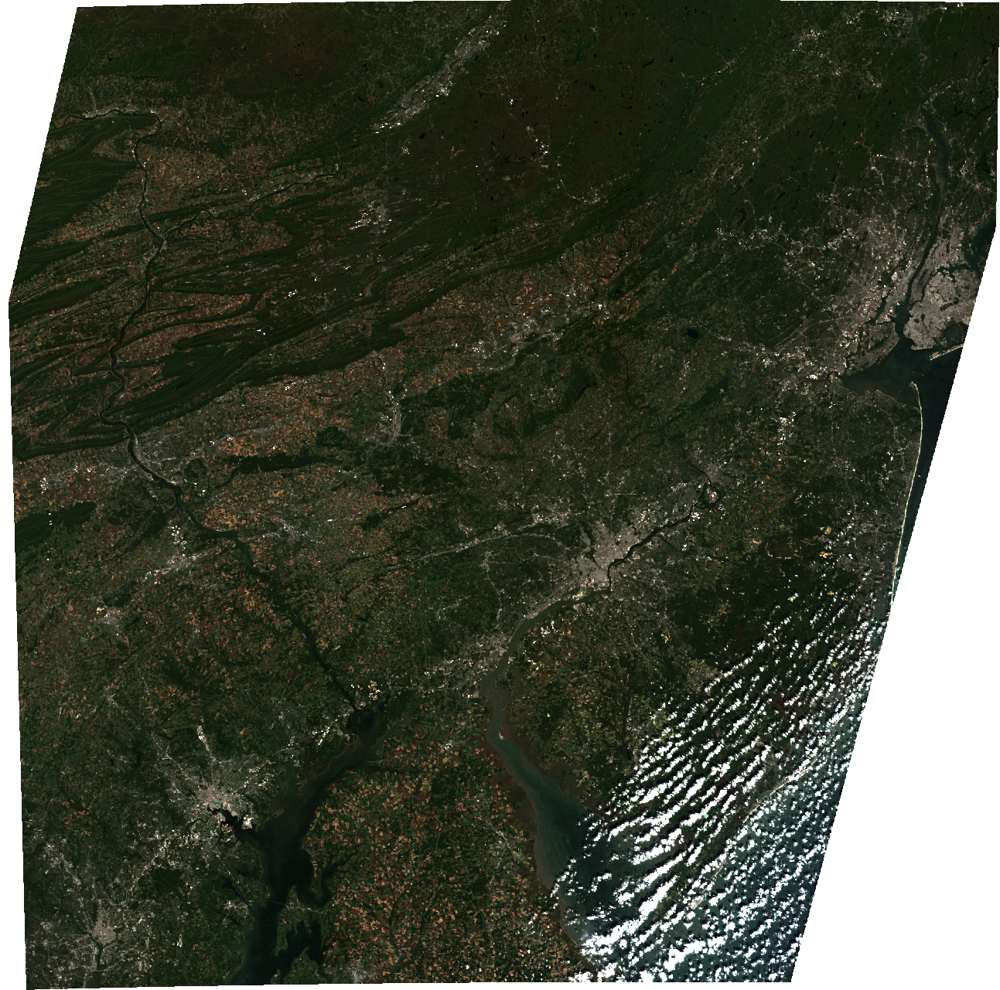

In [13]:
HTML(
    data=f"""
<style> .img-two-column{{
  width: 50%;
  float: left;
}}</style>
<img src="{img_zoomed_in}" alt="Sentinel-2 Zoom in" class="img-two-column">
<img src="{img_ovr.url}" alt="Sentinel-2 Mosaic" class="img-two-column">
"""
)

https://hamedalemo.github.io/advanced-geo-python/lectures/earth_search_tutorial.html?utm_source=chatgpt.com

In [14]:
from pystac_client import Client

In [15]:
api_url = "https://earth-search.aws.element84.com/v1"

In [16]:
client = Client.open(api_url)

In [17]:
collections = client.get_collections()

In [18]:
for collection in collections:
    print(collection)

<CollectionClient id=sentinel-2-pre-c1-l2a>
<CollectionClient id=cop-dem-glo-30>
<CollectionClient id=naip>
<CollectionClient id=cop-dem-glo-90>
<CollectionClient id=landsat-c2-l2>
<CollectionClient id=sentinel-2-l2a>
<CollectionClient id=sentinel-2-l1c>
<CollectionClient id=sentinel-2-c1-l2a>
<CollectionClient id=sentinel-1-grd>


In [19]:
s1_collection = client.get_collection("sentinel-1-grd")
s1_collection

<CollectionClient id=sentinel-1-grd>

In [20]:
import leafmap


In [21]:
m = leafmap.Map(center=[40.050809, -75.522833], zoom=16, height="800px")
m

Map(center=[40.050809, -75.522833], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…

In [22]:
if m.user_rois is not None:
    point = m.user_rois['features'][0]['geometry']
else:
    point = dict(type="Point", coordinates=(39.8, -75.7))

In [23]:
search_results = client.search(
    collections=["sentinel-2-l2a"],
    intersects=point,
    max_items=12,
)

In [24]:
print(search_results.matched())

949


In [25]:
items = search_results.item_collection()


In [26]:
len(items)

12

In [27]:
items[0]

<Item id=S2B_37CER_20251120_0_L2A>

In [28]:
print(items[0].datetime)

2025-11-20 05:40:40.236000+00:00


In [29]:
print(items[0].geometry)

{'type': 'Polygon', 'coordinates': [[[38.99931160706748, -75.68467648104316], [38.99926188949473, -76.66776672802581], [40.42907365257901, -76.66323226114405], [42.98005213226685, -75.70470429143538], [42.96764248517343, -75.65168904725913], [38.99931160706748, -75.68467648104316]]]}


In [30]:
search = client.search(
    collections=["sentinel-2-l2a"],
    intersects=point,
    datetime="2025-01-01/2025-09-22"
)

In [31]:
print(search.matched())

60


In [32]:
search = client.search(
    collections=["sentinel-2-l2a"],
    intersects=point,
    datetime="2025-01-01/2025-09-22",
    query=["eo:cloud_cover<5"],
    max_items=10
)

In [33]:
print(search.matched())

31


In [34]:
search = client.search(
    collections=["sentinel-2-l2a"],
    intersects=point,
    datetime="2025-01-01/2025-09-22",
    query=["eo:cloud_cover<5"],
    sortby=["+properties.eo:cloud_cover"],
    max_items=10
)

In [35]:
items = search.item_collection()

In [36]:
len(items)

10

In [37]:
for item in items:
    print(item.properties["eo:cloud_cover"])

0
0.014819
0.022765
0.025892
0.047634
0.066098
0.084366
0.120601
0.124589
0.125461


In [38]:
items.save_object("search.json")

In [39]:
#Let's look at the second item:
selected_item = items[0]

In [40]:
# Here are the assets available for this item
assets = selected_item.assets
print(assets.keys())

dict_keys(['aot', 'blue', 'coastal', 'granule_metadata', 'green', 'nir', 'nir08', 'nir09', 'red', 'rededge1', 'rededge2', 'rededge3', 'scl', 'swir16', 'swir22', 'thumbnail', 'tileinfo_metadata', 'visual', 'wvp', 'aot-jp2', 'blue-jp2', 'coastal-jp2', 'green-jp2', 'nir-jp2', 'nir08-jp2', 'nir09-jp2', 'red-jp2', 'rededge1-jp2', 'rededge2-jp2', 'rededge3-jp2', 'scl-jp2', 'swir16-jp2', 'swir22-jp2', 'visual-jp2', 'wvp-jp2'])


In [41]:
for key, asset in assets.items():
    print(f"{key}: {asset.title}")

aot: Aerosol optical thickness (AOT)
blue: Blue (band 2) - 10m
coastal: Coastal aerosol (band 1) - 60m
granule_metadata: None
green: Green (band 3) - 10m
nir: NIR 1 (band 8) - 10m
nir08: NIR 2 (band 8A) - 20m
nir09: NIR 3 (band 9) - 60m
red: Red (band 4) - 10m
rededge1: Red edge 1 (band 5) - 20m
rededge2: Red edge 2 (band 6) - 20m
rededge3: Red edge 3 (band 7) - 20m
scl: Scene classification map (SCL)
swir16: SWIR 1 (band 11) - 20m
swir22: SWIR 2 (band 12) - 20m
thumbnail: Thumbnail image
tileinfo_metadata: None
visual: True color image
wvp: Water vapour (WVP)
aot-jp2: Aerosol optical thickness (AOT)
blue-jp2: Blue (band 2) - 10m
coastal-jp2: Coastal aerosol (band 1) - 60m
green-jp2: Green (band 3) - 10m
nir-jp2: NIR 1 (band 8) - 10m
nir08-jp2: NIR 2 (band 8A) - 20m
nir09-jp2: NIR 3 (band 9) - 60m
red-jp2: Red (band 4) - 10m
rededge1-jp2: Red edge 1 (band 5) - 20m
rededge2-jp2: Red edge 2 (band 6) - 20m
rededge3-jp2: Red edge 3 (band 7) - 20m
scl-jp2: Scene classification map (SCL)
swi

In [42]:
print(assets["thumbnail"].href)

https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/C/ES/2025/1/S2B_37CES_20250112_0_L2A/thumbnail.jpg


In [43]:
import requests
img_data = requests.get(assets["thumbnail"].href).content

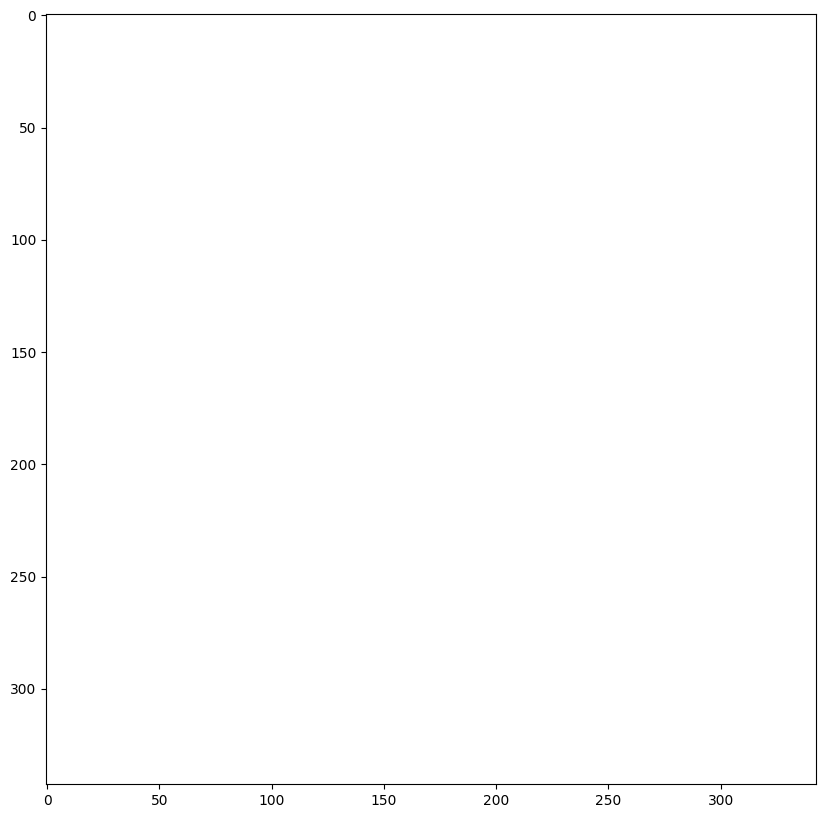

In [44]:
import matplotlib.pyplot as plt
from PIL import Image
import io
plt.figure(figsize=(10, 10))
plt.imshow(Image.open(io.BytesIO(img_data)))

In [45]:
import rioxarray

In [46]:
nir_href = assets["nir"].href
nir = rioxarray.open_rasterio(nir_href)
nir

<xarray.DataArray (band: 1, y: 10980, x: 10980)> Size: 241MB
[120560400 values with dtype=uint16]
Coordinates:
  * band         (band) int64 8B 1
  * y            (y) float64 88kB 1.7e+06 1.7e+06 1.7e+06 ... 1.59e+06 1.59e+06
  * x            (x) float64 88kB 5e+05 5e+05 5e+05 ... 6.098e+05 6.098e+05
    spatial_ref  int64 8B 0
Attributes:
    OVR_RESAMPLING_ALG:  AVERAGE
    AREA_OR_POINT:       Area
    _FillValue:          0
    scale_factor:        1.0
    add_offset:          0.0

In [47]:
import matplotlib.pyplot as plt

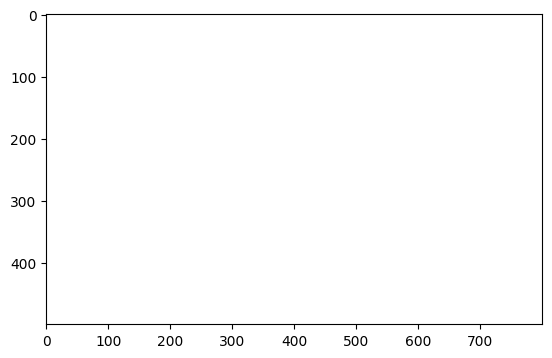

In [48]:
plt.imshow(nir[0,1500:2000,6200:7000], cmap='gray')
plt.clim(vmin=10, vmax=5000)

8.66 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 5 loops each)


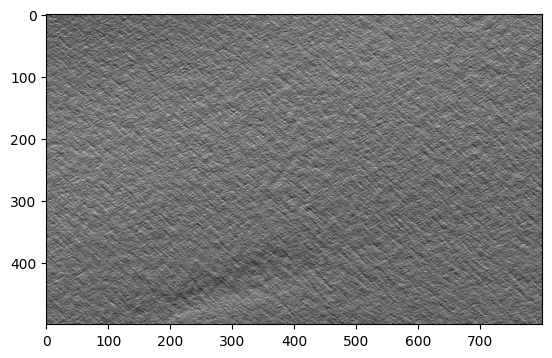

In [49]:
%%timeit -n 5 -r 1
plt.imshow(nir[0,1500:2000,6200:7000], cmap='gray')